In [119]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff
import scipy.stats as stats
import scipy.cluster.hierarchy as sch

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.feature_selection import RFE, VarianceThreshold
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, r2_score, mean_squared_error
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression, Ridge, Lasso, LinearRegression
from sklearn.svm import SVC, SVR
from sklearn.neighbors import KNeighborsRegressor

from pandas.plotting import andrews_curves
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Flatten, Dense, Dropout, BatchNormalization, MaxPooling1D
import warnings
warnings.filterwarnings("ignore")


In [120]:
df = pd.read_csv("/content/1260_CSV .csv")

In [121]:
df.head()

,Molecule Name,chemotype,SMILES,MD: Molecular_weight (g/mol),MD: Total_charge (e),MD: Atom_Count,MD: Heavy_atoms,MD: Asymmetric_atoms,MD: Total_DFT_energy (Hartree),MD: HL_gap (Hartree),...,P: HB-WATER-CORE-1,P: Dxy-CORE-1 (cm2/s),P: Dh-CORE-1 (kJ/mol) (kJ/mol),P: Ds-CORE-1 (J/mol K) (J/mol K),P: HB-CORE-2,P: HB-WATER-CORE-2,P: Dxy-CORE-2 (cm2/s),P: Dh-CORE-2 (kJ/mol) (kJ/mol),P: Ds-CORE-2 (J/mol K) (J/mol K),IC50
0,OU-0000001,2,CC1=CC(N)=C2C=C(NC(=O)C3=CC=C4C=C(C5=CC=CC=C5)...,404.0,1,53.0,31,0.0,-1280.0,0.0851,...,2.867879,2.700000e-08,-716.467,244.991,1.481884,2.782609,-1.100000e-08,-521.143,294.232,0.0
1,OU-0000002,2,CC1=CC(N)=C2C=C(NC(=O)C3=CC=C4C(=C3)C=CC=C4C3=...,404.0,1,53.0,31,0.0,-1280.0,0.0852,...,2.899879,-1.000000e-09,-879.698,246.338,2.643720,2.467391,1.120000e-07,-628.022,307.384,NaN
2,OU-0000003,2,CC1=CC(N)=C2C=C(NC(=O)C3=CC=C4C=C(C5CC5)C=CC4=...,368.0,1,50.0,28,0.0,-1170.0,0.0890,...,1.936068,6.700000e-08,-711.955,308.985,0.863527,2.916667,3.000000e-08,-747.490,321.737,0.0
3,OU-0000004,1,O=C(NC1=CC=C(C2=NCCN2)C=C1)C1=CC=C2C=C(C3CC3)C...,356.0,1,49.0,27,0.0,-1130.0,0.0920,...,1.583535,2.300000e-08,-943.083,209.300,1.498795,2.250602,-4.000000e-09,-547.228,227.329,0.0
4,OU-0000005,2,CC1=CC(N)=C2C=C(NC(=O)C3=CC=C4C=C(C5=CC=C(C)C(...,433.0,1,59.0,33,0.0,-1360.0,0.0762,...,2.699275,2.300000e-08,-682.553,339.795,1.072376,3.396864,1.600000e-08,-688.380,377.210,0.0


In [122]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1260 entries, 0 to 1259
Columns: 178 entries, Molecule Name to IC50
dtypes: float64(167), int64(9), object(2)
memory usage: 1.7+ MB


In [123]:
df.isnull().sum()

,0
Molecule Name,0
chemotype,0
SMILES,0
MD: Molecular_weight (g/mol),0
MD: Total_charge (e),0
...,...
P: HB-WATER-CORE-2,0
P: Dxy-CORE-2 (cm2/s),0
P: Dh-CORE-2 (kJ/mol) (kJ/mol),0
P: Ds-CORE-2 (J/mol K) (J/mol K),0


In [124]:
df['IC50'] = pd.to_numeric(df['IC50'], errors='coerce')
df['IC50'].fillna(df['IC50'].median(), inplace=True)

In [125]:
df.drop(columns=['Molecule Name', 'SMILES', 'chemotype'], errors='ignore', inplace=True)
df.drop_duplicates(inplace=True)

In [126]:
numerical_cols = df.select_dtypes(include=['number']).columns
scaler = MinMaxScaler()
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

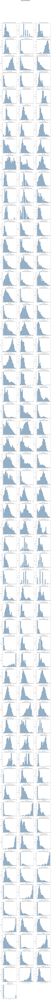

In [127]:
num_cols = len(numerical_cols)
cols = 3
rows = (num_cols // cols) + (num_cols % cols > 0)

fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()

for i, col in enumerate(numerical_cols):
    sns.histplot(df[col], bins=20, kde=True, color='steelblue', edgecolor='black', ax=axes[i])
    axes[i].set_title(f'Distribution of {col}', fontsize=12)
    axes[i].set_xlabel(col, fontsize=10)
    axes[i].set_ylabel("Count", fontsize=10)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Feature Distributions", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


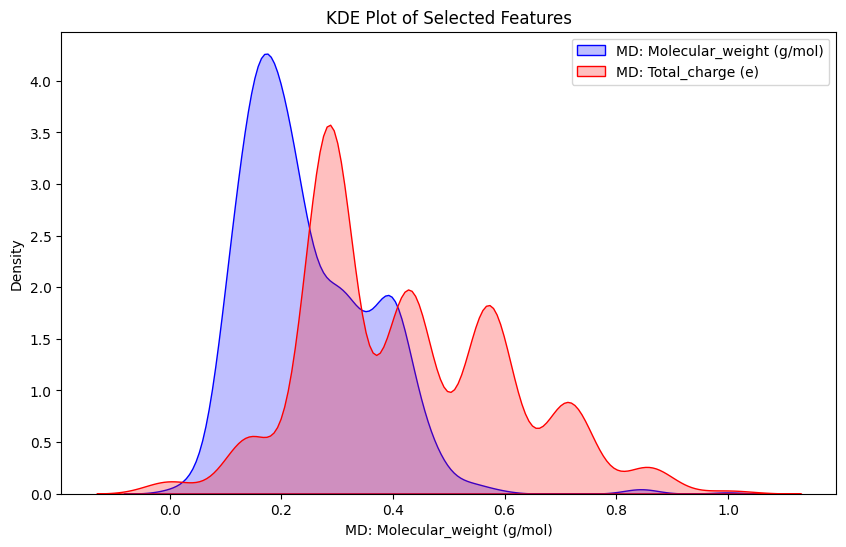

In [128]:
# KDE Plot for feature density
plt.figure(figsize=(10, 6))
sns.kdeplot(df[numerical_cols[0]], fill=True, color="blue", label=numerical_cols[0])
sns.kdeplot(df[numerical_cols[1]], fill=True, color="red", label=numerical_cols[1])
plt.legend()
plt.title("KDE Plot of Selected Features")
plt.show()

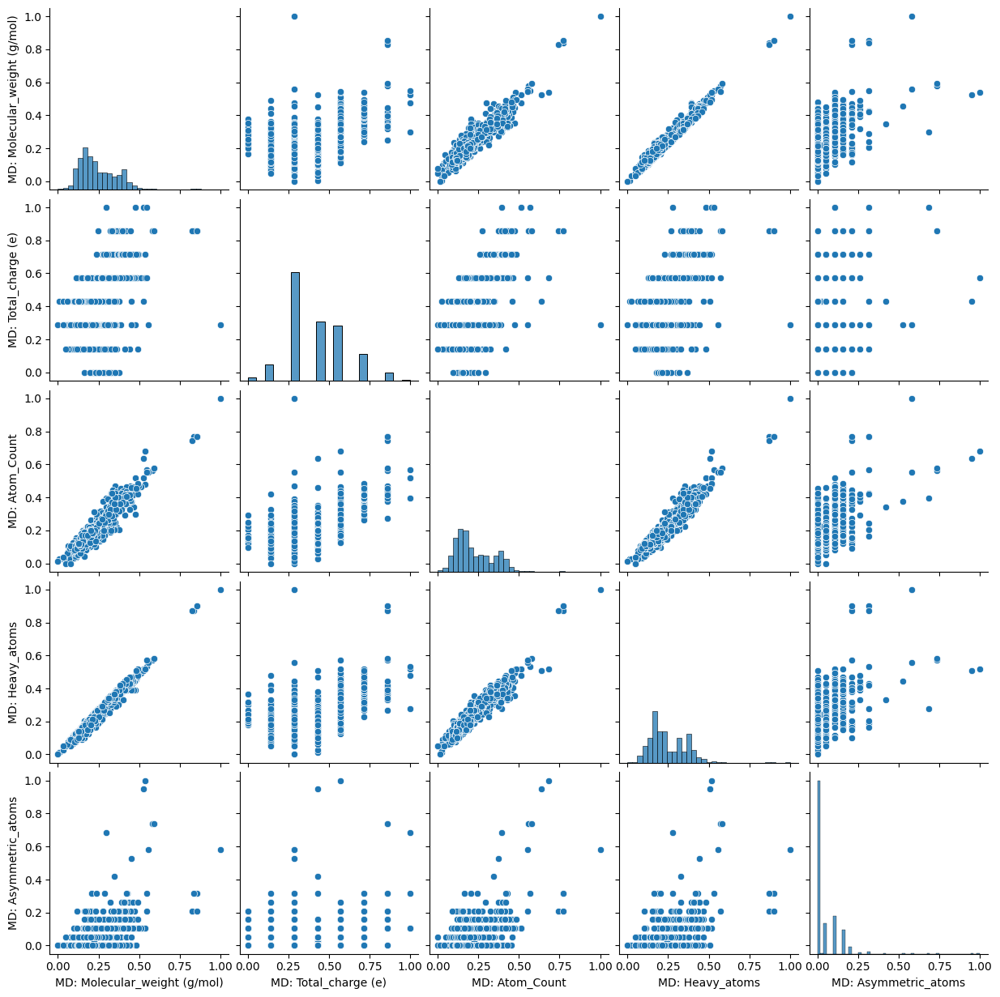

In [129]:
# Pair Plot
sns.pairplot(df[numerical_cols[:5]])
plt.show()


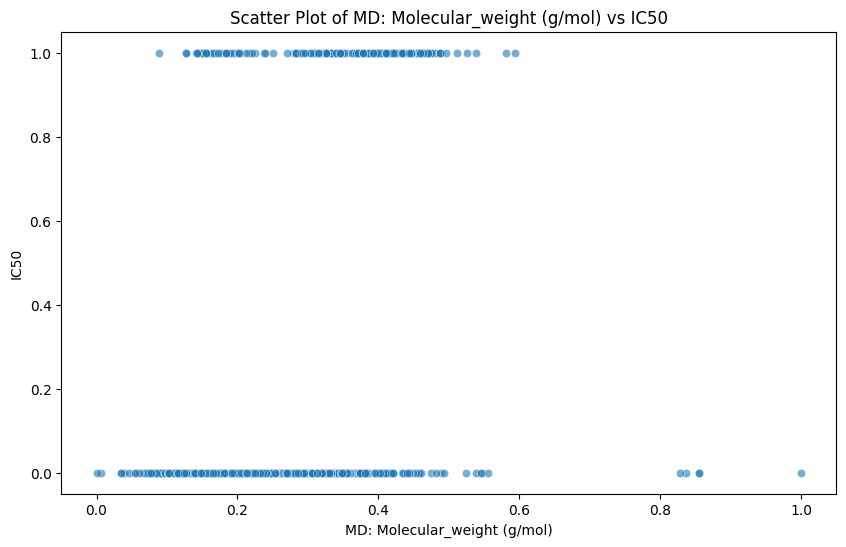

In [130]:
# Scatter Plot of IC50 vs Features
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df[numerical_cols[0]], y=df["IC50"], alpha=0.6)
plt.title(f"Scatter Plot of {numerical_cols[0]} vs IC50")
plt.show()

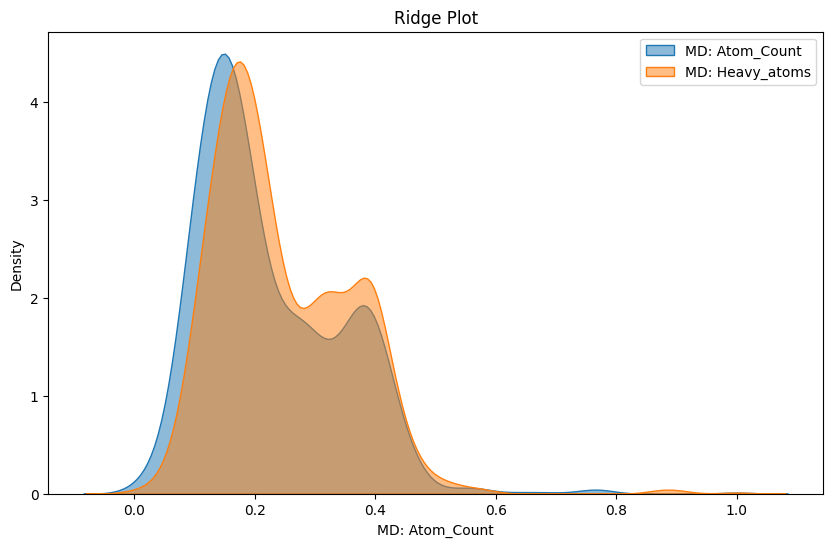

In [131]:

# Ridge Plot
plt.figure(figsize=(10, 6))
sns.kdeplot(df[numerical_cols[2]], fill=True, alpha=0.5, label=numerical_cols[2])
sns.kdeplot(df[numerical_cols[3]], fill=True, alpha=0.5, label=numerical_cols[3])
plt.legend()
plt.title("Ridge Plot")
plt.show()


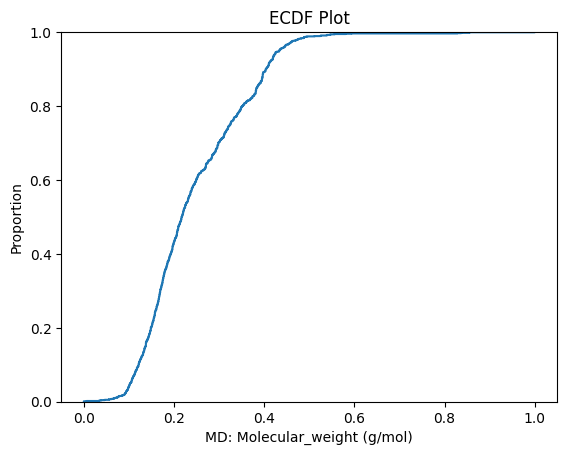

In [132]:
# ECDF Plot
sns.ecdfplot(df[numerical_cols[0]])
plt.title("ECDF Plot")
plt.show()

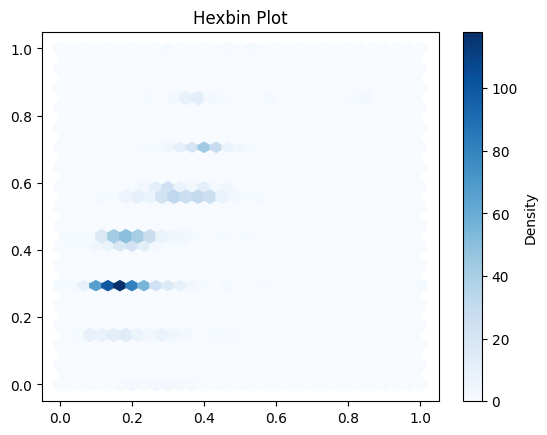

In [133]:
# Hexbin Plot
plt.hexbin(df[numerical_cols[0]], df[numerical_cols[1]], gridsize=30, cmap='Blues')
plt.colorbar(label='Density')
plt.title("Hexbin Plot")
plt.show()

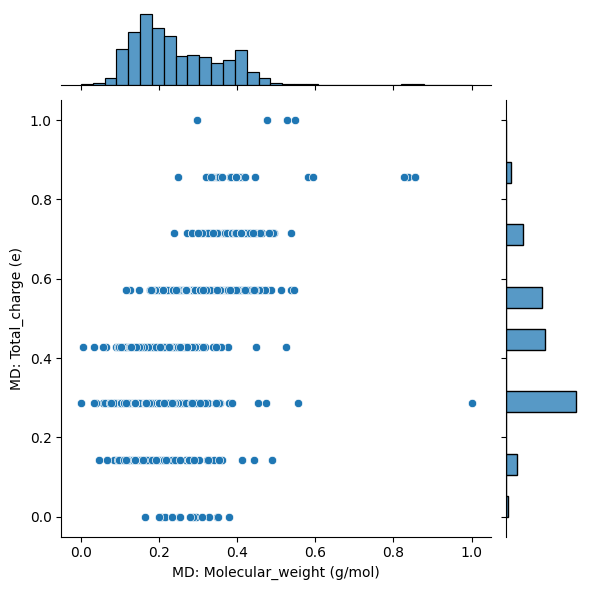

In [134]:
#  Joint Plot
sns.jointplot(x=numerical_cols[0], y=numerical_cols[1], data=df, kind='scatter')
plt.show()


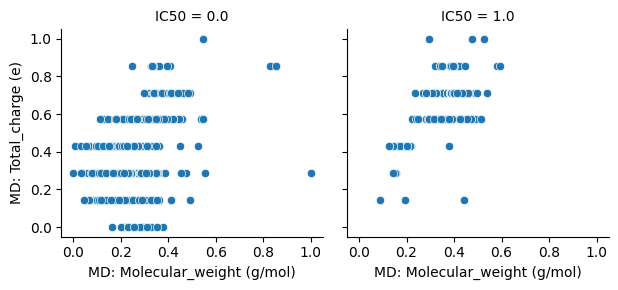

In [135]:
# Facet Grid Plot
g = sns.FacetGrid(df, col="IC50", col_wrap=4)
g.map_dataframe(sns.scatterplot, x=numerical_cols[0], y=numerical_cols[1])
plt.show()


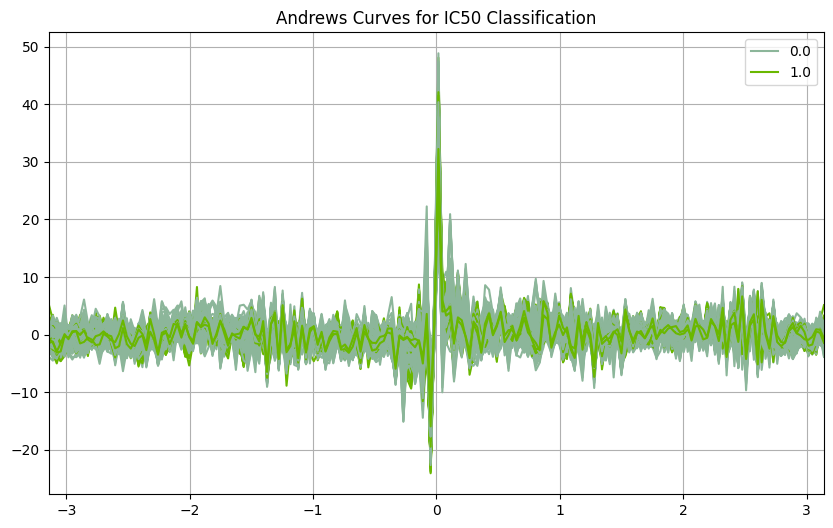

In [136]:
from pandas.plotting import andrews_curves

df['IC50'] = df['IC50'].astype(str)

# Plot Andrews Curves
plt.figure(figsize=(10, 6))
andrews_curves(df, "IC50")
plt.title("Andrews Curves for IC50 Classification")
plt.show()


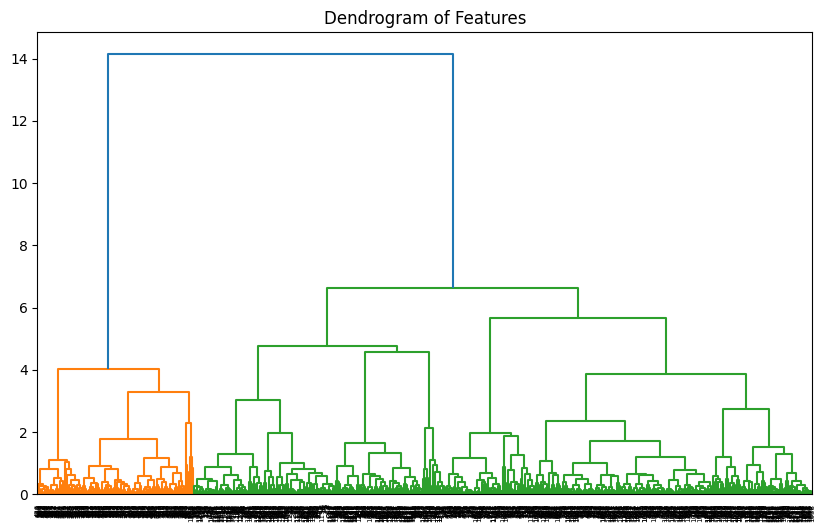

In [137]:
# Dendrogram for Feature Clustering
plt.figure(figsize=(10, 6))
sch.dendrogram(sch.linkage(df[numerical_cols[:10]], method='ward'))
plt.title("Dendrogram of Features")
plt.show()

In [138]:

# Treemap for Feature Importance
fig = px.treemap(df, path=[numerical_cols[0]], values=numerical_cols[1], title="Treemap of Features")
fig.show()

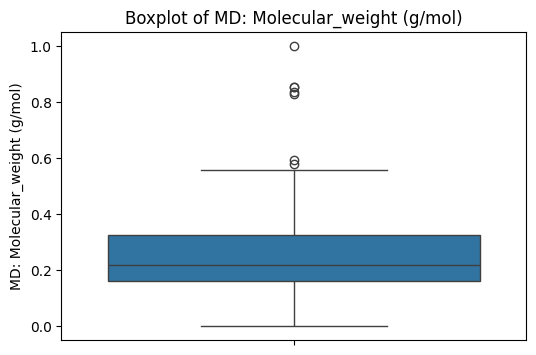

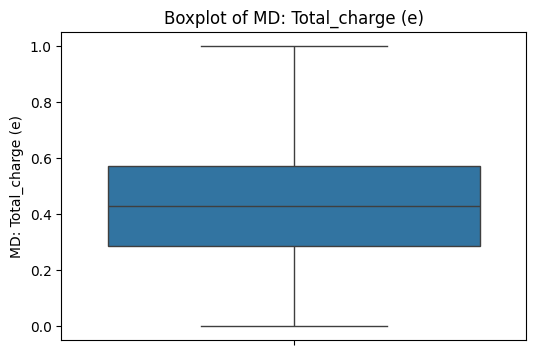

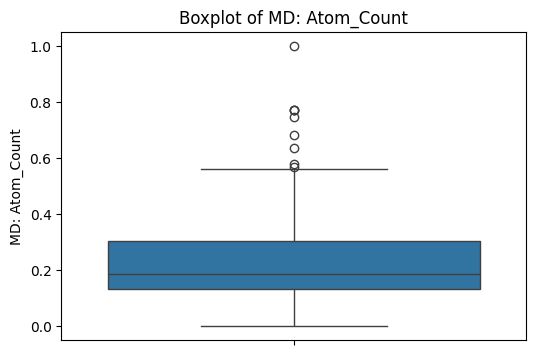

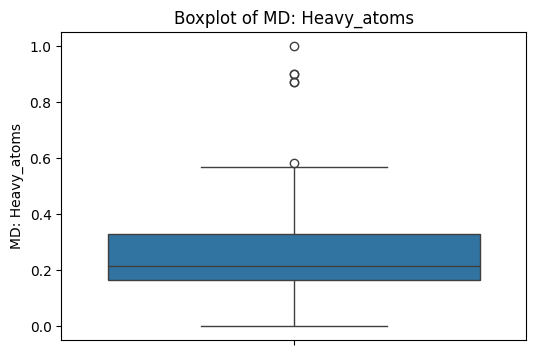

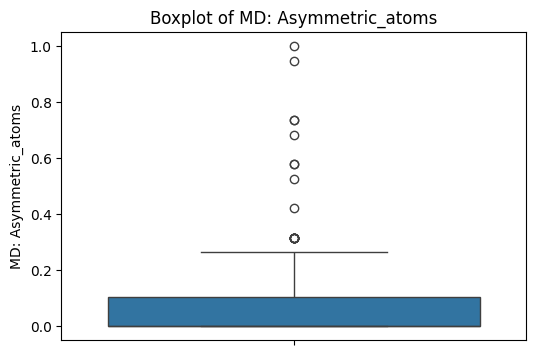

...

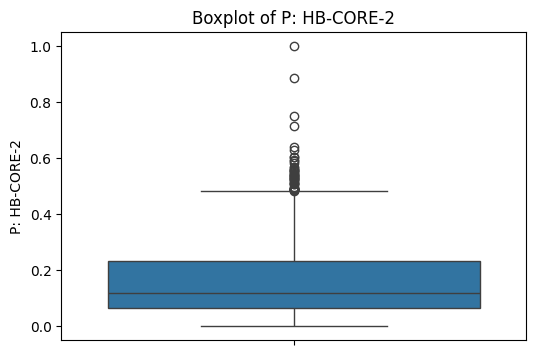

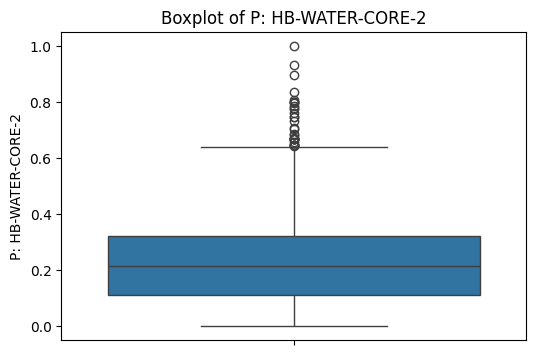

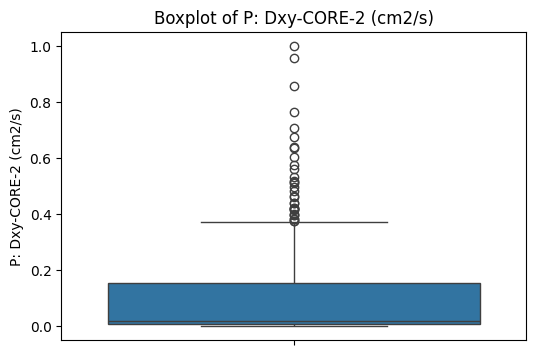

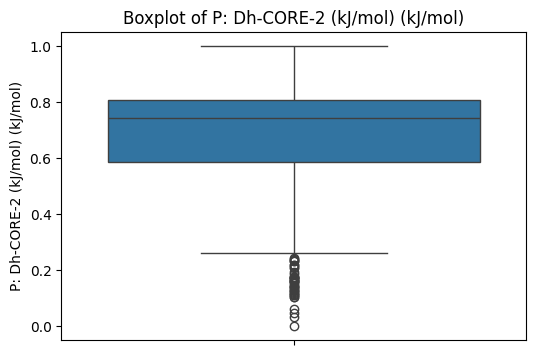

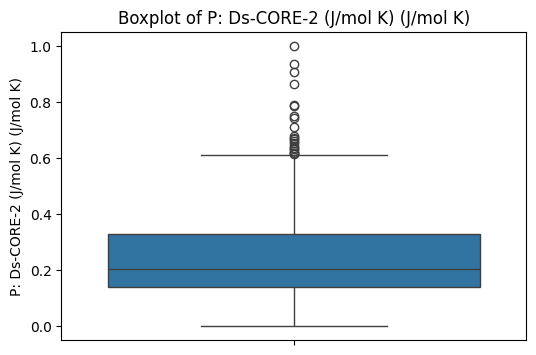

In [139]:
df_numeric = df.select_dtypes(include=['number'])

num_cols = df_numeric.columns

for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df_numeric[col])
    plt.title(f"Boxplot of {col}")
    plt.show()

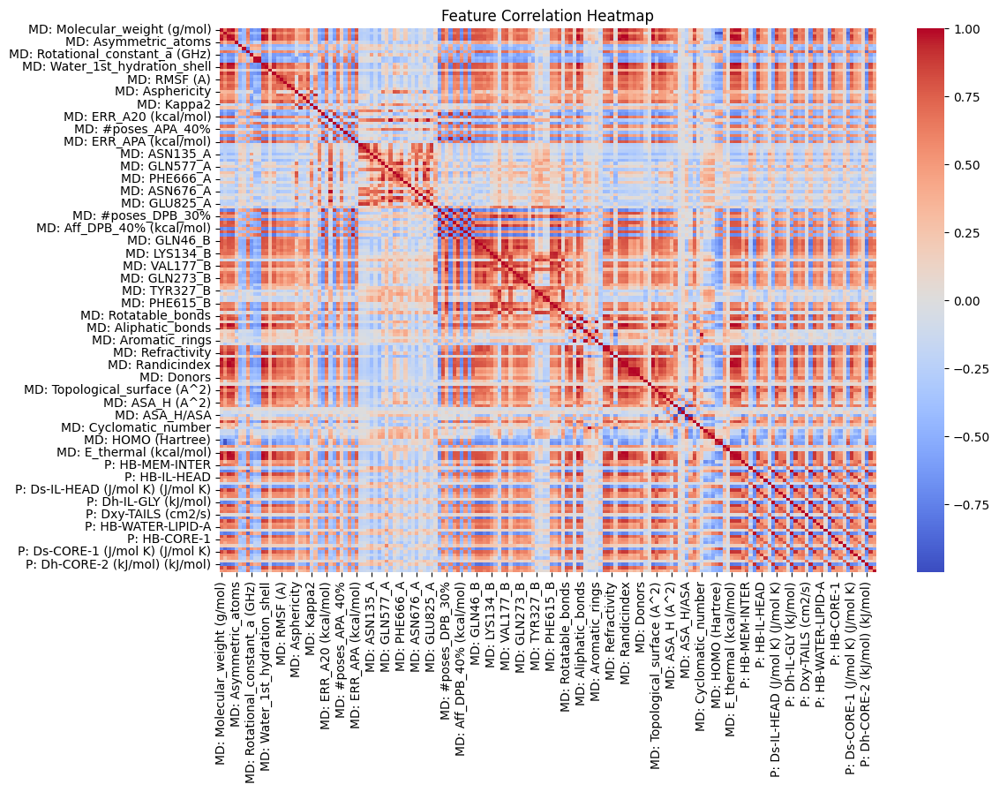

In [140]:
plt.figure(figsize=(12, 8))
sns.heatmap(df[numerical_cols].corr(), cmap="coolwarm", annot=False)
plt.title("Feature Correlation Heatmap")
plt.show()

In [141]:
X_base = df.drop(columns=['IC50'])
y_base = df['IC50']

X_train_base, X_test_base, y_train_base, y_test_base = train_test_split(X_base, y_base,train_size=0.1, random_state=42)

base_models = {
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=5, max_depth=1, random_state=42),
'Random Forest': RandomForestClassifier(n_estimators=5, max_depth=1, random_state=42),
'SVM': SVC(kernel='linear', C=0.01, probability=True, random_state=42),
'AdaBoost': AdaBoostClassifier(n_estimators=5, random_state=42),
'Logistic Regression': LogisticRegression(C=0.01, max_iter=100, random_state=42)
}

baseline_results = {}

for name, model in base_models.items():
    model.fit(X_train_base, y_train_base)
    y_pred = model.predict(X_test_base)
    acc = accuracy_score(y_test_base, y_pred)
    report = classification_report(y_test_base, y_pred, output_dict=True)

    baseline_results[name] = {
        'Accuracy': acc,
        'Report': report
    }

    print(f"{name} - Baseline Accuracy: {acc:.4f}")
    print(classification_report(y_test_base, y_pred))
    print("-" * 60)

Gradient Boosting - Baseline Accuracy: 0.9101
              precision    recall  f1-score   support

         0.0       0.94      0.95      0.94       914
         1.0       0.79      0.73      0.76       220

    accuracy                           0.91      1134
   macro avg       0.86      0.84      0.85      1134
weighted avg       0.91      0.91      0.91      1134

------------------------------------------------------------
Random Forest - Baseline Accuracy: 0.9004
              precision    recall  f1-score   support

         0.0       0.93      0.95      0.94       914
         1.0       0.76      0.71      0.73       220

    accuracy                           0.90      1134
   macro avg       0.85      0.83      0.84      1134
weighted avg       0.90      0.90      0.90      1134

------------------------------------------------------------
SVM - Baseline Accuracy: 0.8959
              precision    recall  f1-score   support

         0.0       0.91      0.97      0.94      

In [142]:
numerical_cols = df.select_dtypes(include=[np.number]).columns

z_scores = np.abs(stats.zscore(df[numerical_cols]))
df_cleaned = df[(z_scores < 3).all(axis=1)]

In [143]:
corr_matrix = df[numerical_cols].corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop_corr = [col for col in upper.columns if any(upper[col] > 0.9)]
df.drop(columns=to_drop_corr, inplace=True)

In [144]:
print("Highly correlated features  droped (correlation > 0.9):")
print(to_drop_corr)



Highly correlated features  droped (correlation > 0.9):
['MD: Atom_Count', 'MD: Heavy_atoms', 'MD: Rotational_constant_c (GHz)', 'MD: Volume (A^3)', 'MD: Water_1st_hydration_shell', 'MD: Water_2nd_hydration_shell', 'MD: ERR_K2', 'MD: Aff_APA (kcal/mol)', 'MD: THR91_A', 'MD: PHE617_A', 'MD: PHE664_A', 'MD: PHE666_A', 'MD: ASN676_A', 'MD: ARG716_A', 'MD: ASN718_A', 'MD: Aff_DPB_20% (kcal/mol)', 'MD: Aff_DPB_30% (kcal/mol)', 'MD: ERR_B30 (kcal/mol)', 'MD: Aff_DPB_40% (kcal/mol)', 'MD: ERR_B40 (kcal/mol)', 'MD: Aff_DPB (kcal/mol)', 'MD: GLN46_B', 'MD: THR89_B', 'MD: ARG128_B', 'MD: THR130_B', 'MD: PHE136_B', 'MD: GLN176_B', 'MD: VAL177_B', 'MD: PHE178_B', 'MD: SER180_B', 'MD: ASP274_B', 'MD: ILE277_B', 'MD: TYR327_B', 'MD: VAL612_B', 'MD: PHE615_B', 'MD: PHE617_B', 'MD: ARG620_B', 'MD: PHE628_B', 'MD: Bonds', 'MD: Aliphatic_bonds', 'MD: Aromatic_bonds', 'MD: Aromatic_rings', 'MD: Chainatoms', 'MD: Chainbonds', 'MD: Refractivity', 'MD: Hararyindex', 'MD: Plattindex', 'MD: Randicindex', 'MD:

In [145]:
X = df.drop(columns=['IC50'])
y = df['IC50'].astype(float)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [146]:
selector = RFE(RandomForestClassifier(), n_features_to_select=min(30, X.shape[1]))
selector.fit(X_train, y_train.astype(int))
selected_features = X.columns[selector.support_]
X_train = X_train[selected_features]
X_test = X_test[selected_features]


In [147]:
pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [148]:
print("Number of PCA components retained:", pca.n_components_)

print("\nExplained variance ratio for each component:")
print(pca.explained_variance_ratio_)


print("\nCumulative explained variance ratio:")
print(np.cumsum(pca.explained_variance_ratio_))

Number of PCA components retained: 16

Explained variance ratio for each component:
[0.50473004 0.11904397 0.06584241 0.0527551  0.04071855 0.02871695
 0.02513187 0.02192786 0.01899458 0.01705924 0.01392516 0.01104603
 0.01011256 0.00930452 0.00749126 0.00720565]

Cumulative explained variance ratio:
[0.50473004 0.623774   0.68961642 0.74237151 0.78309007 0.81180702
 0.83693889 0.85886674 0.87786132 0.89492056 0.90884571 0.91989174
 0.9300043  0.93930883 0.94680009 0.95400575]


In [149]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_pca)
X_test_scaled = scaler.transform(X_test_pca)


In [150]:
models = {
    "AdaBoost": AdaBoostClassifier(),
    "Random Forest": RandomForestClassifier(),
    "SVM": SVC(probability=True),
    "Gradient Boosting": GradientBoostingClassifier(),
    "Logistic Regression": LogisticRegression()
}

results = {}
for name, model in models.items():
    model.fit(X_train_scaled, y_train.astype(int))
    y_pred = model.predict(X_test_scaled)
    results[name] = {
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average='weighted'),
        "Recall": recall_score(y_test, y_pred, average='weighted'),
        "F1-Score": f1_score(y_test, y_pred, average='weighted'),
        "Confusion Matrix": confusion_matrix(y_test, y_pred),
        "Classification Report": classification_report(y_test, y_pred, output_dict=True)
    }

In [151]:
metrics_df = pd.DataFrame([
    {
        'Model': name,
        **{metric: round(score, 4) for metric, score in scores.items() if isinstance(score, float)}
    } for name, scores in results.items()
])

In [152]:
metrics_df

,Model,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,0.9127,0.9162,0.9127,0.9141
1,Random Forest,0.9286,0.9316,0.9286,0.9297
2,SVM,0.9206,0.9259,0.9206,0.9225
3,Gradient Boosting,0.9246,0.9269,0.9246,0.9255
4,Logistic Regression,0.9206,0.9239,0.9206,0.9219


In [153]:
X_ann = np.expand_dims(X_train_scaled, axis=2)
X_test_ann = np.expand_dims(X_test_scaled, axis=2)


y_train = y_train.astype(float)

model = Sequential([
    Conv1D(64, 3, activation='relu', input_shape=(X_ann.shape[1], 1)),
    BatchNormalization(),
    MaxPooling1D(2),
    Conv1D(128, 3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='linear')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(X_ann, y_train, validation_split=0.2, epochs=10, batch_size=32)

Epoch 1/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.6494 - loss: 4.2338 - val_accuracy: 0.8168 - val_loss: 2.9523
Epoch 2/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8096 - loss: 2.9706 - val_accuracy: 0.8168 - val_loss: 2.9167
Epoch 3/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8209 - loss: 2.7823 - val_accuracy: 0.8168 - val_loss: 2.5718
Epoch 4/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8255 - loss: 2.2273 - val_accuracy: 0.8168 - val_loss: 2.3728
Epoch 5/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8102 - loss: 2.8046 - val_accuracy: 0.8168 - val_loss: 1.8512
Epoch 6/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8346 - loss: 2.3897 - val_accuracy: 0.8366 - val_loss: 1.5885
Epoch 7/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8394 - loss: 2.2384 - val_accuracy: 0.8812 - val_loss: 0.7913
Epoch 8/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8454 - loss: 1.9676 - val_accuracy: 0.9158 - val_loss

In [154]:
y_test = y_test.astype(float)

loss, accuracy = model.evaluate(X_test_ann, y_test)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8387 - loss: 1.0398 
Test Loss: 1.0485
Test Accuracy: 0.8532


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


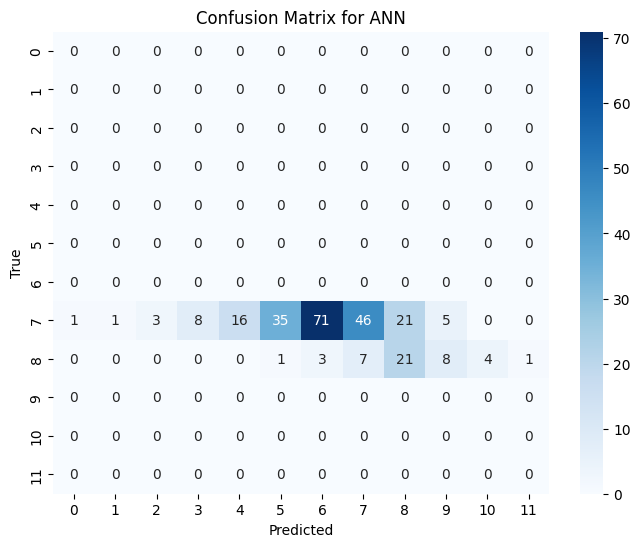

In [155]:
y_pred_ann = model.predict(X_test_ann)
y_pred_ann_classes = np.round(y_pred_ann)

cm = confusion_matrix(y_test, y_pred_ann_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for ANN')
plt.show()

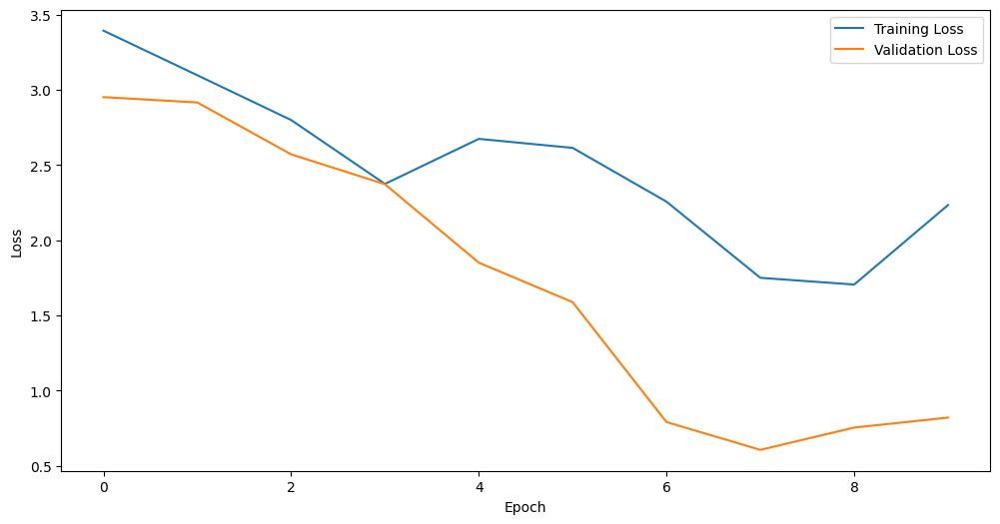

In [156]:
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

In [157]:
for name, result in results.items():
    print(f"Classification Report for {name}:")
    print(pd.DataFrame(result["Classification Report"]))
    print("-" * 50)


Classification Report for AdaBoost:
                  0.0        1.0  accuracy   macro avg  weighted avg
precision    0.955665   0.734694  0.912698    0.845179      0.916206
recall       0.937198   0.800000  0.912698    0.868599      0.912698
f1-score     0.946341   0.765957  0.912698    0.856149      0.914130
support    207.000000  45.000000  0.912698  252.000000    252.000000
--------------------------------------------------
Classification Report for Random Forest:
                  0.0        1.0  accuracy   macro avg  weighted avg
precision    0.965517   0.775510  0.928571    0.870514      0.931587
recall       0.946860   0.844444  0.928571    0.895652      0.928571
f1-score     0.956098   0.808511  0.928571    0.882304      0.929743
support    207.000000  45.000000  0.928571  252.000000    252.000000
--------------------------------------------------
Classification Report for SVM:
                  0.0        1.0  accuracy   macro avg  weighted avg
precision    0.965174   0.74509

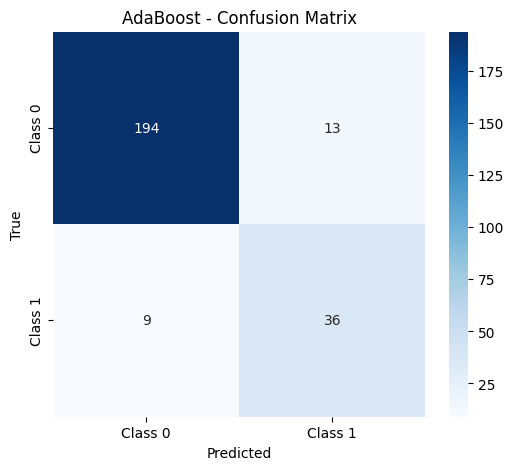

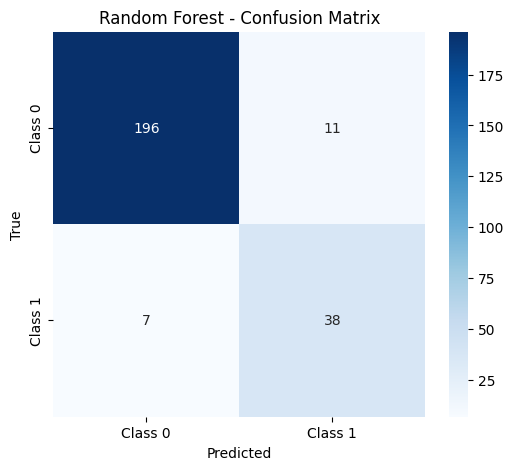

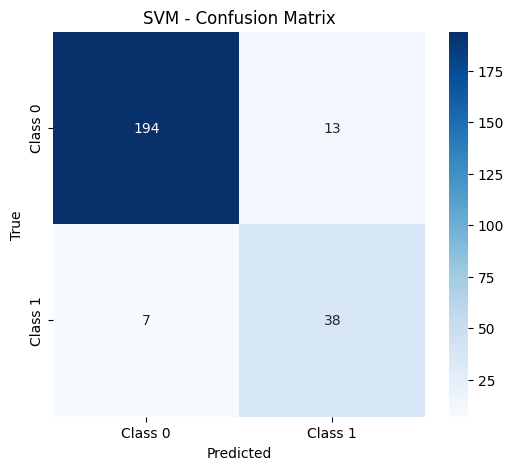

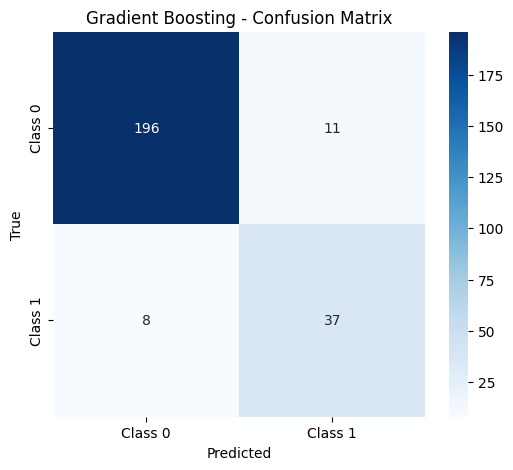

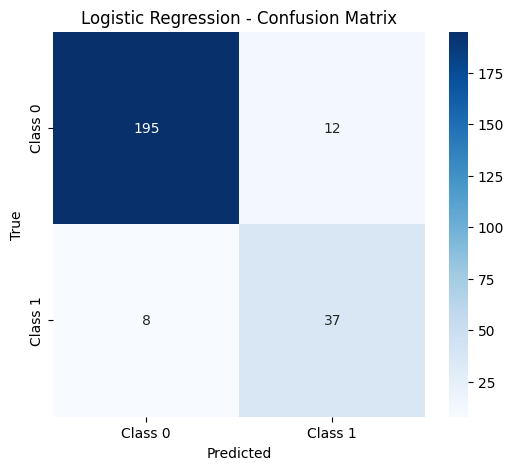

In [158]:
for name, model in models.items():

    y_pred = model.predict(X_test_scaled)

    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
    plt.title(f'{name} - Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

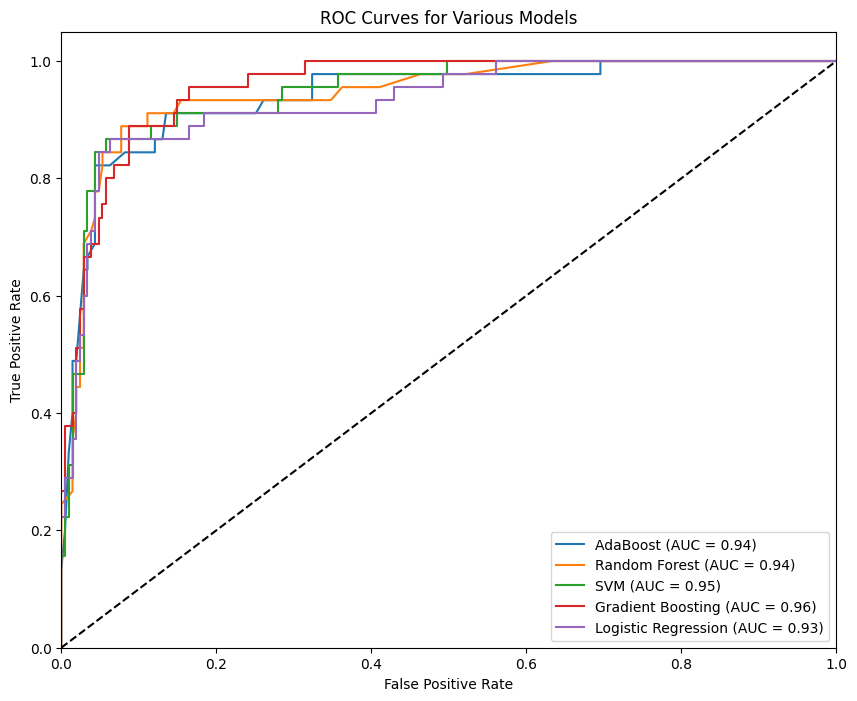

In [159]:
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 8))
for name, model in models.items():
    model.fit(X_train, y_train)

    try:
        y_prob = model.predict_proba(X_test)[:, 1]
    except AttributeError:
        y_prob = model.decision_function(X_test)

    fpr, tpr, _ = roc_curve(y_test, y_prob)
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Various Models')
plt.legend(loc='best')
plt.show()

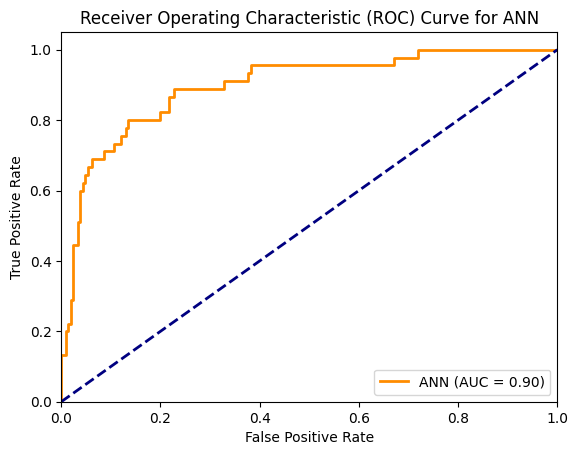

In [160]:
fpr_ann, tpr_ann, thresholds_ann = roc_curve(y_test.astype(int), y_pred_ann)
roc_auc_ann = auc(fpr_ann, tpr_ann)

plt.figure()
plt.plot(fpr_ann, tpr_ann, color='darkorange', lw=2, label=f'ANN (AUC = {roc_auc_ann:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for ANN')
plt.legend(loc="lower right")
plt.show()


In [161]:
fig = px.bar(metrics_df, x='Model', y='Accuracy', title='Model Accuracy Comparison',
             labels={'Accuracy': 'Accuracy Score'}, text=metrics_df['Accuracy'].round(4),
             color='Accuracy', color_continuous_scale='viridis')
fig.update_traces(textposition='outside')
fig.show()